# Given Code

## IKpy Quickstart #

Import the IKPy module : 

In [1]:
import ikpy.chain
import numpy as np
import ikpy.utils.plot as plot_utils
import scipy
import matplotlib.pyplot as plt
import math
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d import Axes3D  # import registers 3D projection
from ikpy.utils import geometry

The basic element of IKPy is the kinematic `Chain`.
To create a chain from an URDF file : 

In [2]:
my_chain = ikpy.chain.Chain.from_urdf_file("./ur5/ur5_gripper.urdf")

/home/zuberw/Documents/597F/Lab2/lab-2-ik/.pixi/envs/default/lib/python3.12/site-packages/ikpy/chain.py:60: UserWarning: Link Base link (index: 0) is of type 'fixed' but set as active in the active_links_mask. In practice, this fixed link doesn't provide any transformation so is as it were inactive
  warnings.warn("Link {} (index: {}) is of type 'fixed' but set as active in the active_links_mask. In practice, this fixed link doesn't provide any transformation so is as it were inactive".format(link.name, link_index))
/home/zuberw/Documents/597F/Lab2/lab-2-ik/.pixi/envs/default/lib/python3.12/site-packages/ikpy/chain.py:60: UserWarning: Link ee_fixed_joint (index: 7) is of type 'fixed' but set as active in the active_links_mask. In practice, this fixed link doesn't provide any transformation so is as it were inactive
  warnings.warn("Link {} (index: {}) is of type 'fixed' but set as active in the active_links_mask. In practice, this fixed link doesn't provide any transformation so is as 

## Inverse kinematics

In Inverse Kinematics, you want your kinematic chain to reach a 3D position in space.

To have a more general representation of position, IKPy works with homogeneous coordinates. Homogenous coordinates are represented as a 4x4 matrix storing both position and orientation. Here we only consider (x,y,z) position, not orientation of the chain.

In [3]:
TARGET_LENGTH = 1.0872

In [4]:
target_position = [ 0.1, -0.2, 0.1]

In [5]:
target_position = [0.0, 0.0, 1.0872]

In [6]:
print("The joint angles are : ", my_chain.inverse_kinematics(target_position))

The joint angles are :  [ 0.          0.48494378 -1.57084153  0.20242219  3.14159263 -2.14397977
  0.          0.        ]


You can check that the Inverse Kinematics is correct by comparing with the original position vector : 

In [7]:
real_frame = my_chain.forward_kinematics(my_chain.inverse_kinematics(target_position))
print("Computed position vector : %s, goal position vector : %s" % (real_frame[:3, 3], target_position))

Computed position vector : [-0.03007344  0.05708022  0.98516383], goal position vector : [0.0, 0.0, 1.0872]


## Plotting
And finally plot the result : 

In [8]:
%matplotlib notebook
%matplotlib ipympl

fig, ax = plot_utils.init_3d_figure()
my_chain.plot(my_chain.inverse_kinematics(target_position), ax, target=target_position)
plt.close()


# Question 1
From the xacro file, can you determine the lengths of each link of the robot arm? What are the lengths? Given these, as well as the visualization of our robot arm in yourdfpy, what do you think the maximum range of the robot arm is (approximately)? Note that units are in meters.

**Answer**: 

From the xacro file I can determine the lengths of each link of the robot arm. Below are the defined lengths.

upperarm: 0.42500m

forearm: 0.39225m

wrist_1: 0.093m

wrist_2: 0.09465m

wrist_3: 0.0823m

Based on these lengths, I estimate the maximum range to be approximately 1.0872m.

# Question 2
Can you get your robot end effector to the maximum range you estimated in Q1, along any of the x/y/z axes? Why or why not?

**Answer:**

I was unable to get the robot end effector to the estimated maximum range. This is because I did not account for the wrist lengths being fixed at specific angles from the forearm.

# Question 3
Write code to find and visualize the 3D volume of points that are reachable by the robot arm. Hints: the forward kinematics function gives you the actual position of the end effector for a given target position. The target position is visualized as a red dot in the original plotting code. You want to randomly sample from points on a large sphere around the robot, and attempt to get the robot to reach those points, such that the arm is fully "stretched". Record the resulting points, and visualize. You may want the "Convex Hull" method in the "scipy" library, as well as the method plot_trisurf from the matplotlib library. AI is allowed for producing the visualization code, but not for sampling from the sphere. Sampling points on the surface of a sphere is a non-trivial problem.

**Answer:**

  Below is code for generating the sphere of the actual maximum range for each potential sphere point.

In [9]:
SPHERE_POINTS = 300

In [10]:
target_sphere = np.zeros((SPHERE_POINTS, 3))

In [11]:
mu, sigma = 0, 0.1 # mean and standard deviation
for point in range(len(target_sphere)):
    x = np.random.normal(mu, sigma)
    y = np.random.normal(mu, sigma)
    z = np.random.normal(mu, sigma)
    r = math.sqrt(x*x + y*y + z*z)
    target_sphere[point, 0] = x / r * TARGET_LENGTH
    target_sphere[point, 1] = y / r * TARGET_LENGTH
    target_sphere[point, 2] = z / r * TARGET_LENGTH

In [12]:
def plot_sphere(sphere):
    """Sphere plotting code generated using Perplexity AI tool."""
    # 1. Compute convex hull
    hull = ConvexHull(sphere)  # hull.simplices is (n_triangles, 3) of point indices
    
    # 2. Prepare coordinates
    x = sphere[:, 0]
    y = sphere[:, 1]
    z = sphere[:, 2]
    
    # 3. Plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    # Triangulated surface from hull
    ax.plot_trisurf(x, y, z, triangles=hull.simplices, color='pink', alpha=0.8)
    
    # Optionally scatter the original points
    ax.scatter(x, y, z, color='k', s=10)
    
    plt.show()

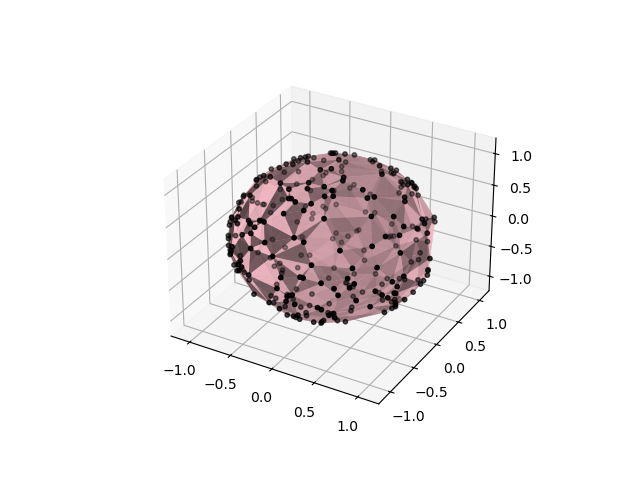

In [13]:
plot_sphere(target_sphere)

In [14]:
plt.close()

In [15]:
real_sphere = np.zeros((SPHERE_POINTS, 3))
for point in range(len(target_sphere)):
    target_position = target_sphere[point]
    real_frame = my_chain.forward_kinematics(my_chain.inverse_kinematics(target_position))
    real_sphere[point] = real_frame[:3, 3]

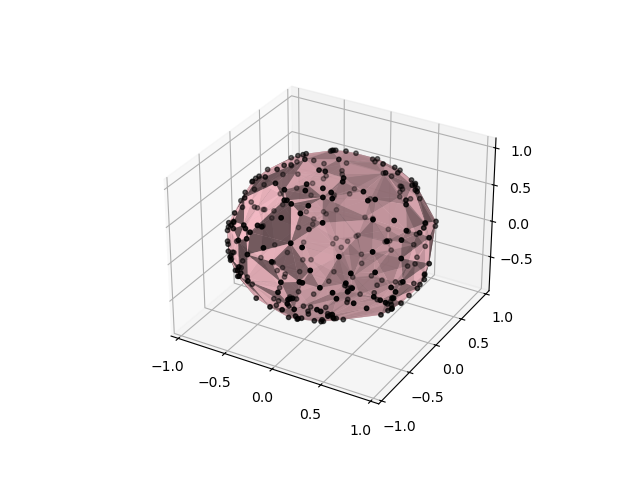

In [16]:
plot_sphere(real_sphere)

In [17]:
plt.close()

# Question 4
Define and visualize a plane in the space with the robot arm; the plane should not intersect the robot arm when all the joints are set to zero position. Write code to determine if any part of the robot arm is intersecting the plane for an arbitrary pose of the robot arm, and include at least three test cases for your method.

In [18]:
# We want all angles set to zero, for position zero
target_angles = [0.0] * len(my_chain.links) 

# translation is the robot's rotation and position values after bringing it to position zero.
translation = my_chain.forward_kinematics(target_angles, full_kinematics=True)

print(translation)


[array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]]), array([[1.      , 0.      , 0.      , 0.      ],
       [0.      , 1.      , 0.      , 0.      ],
       [0.      , 0.      , 1.      , 0.089159],
       [0.      , 0.      , 0.      , 1.      ]]), array([[ 1.79489651e-09,  0.00000000e+00,  1.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
         1.35850000e-01],
       [-1.00000000e+00,  0.00000000e+00,  1.79489651e-09,
         8.91590000e-02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]]), array([[ 1.79489651e-09,  0.00000000e+00,  1.00000000e+00,
         4.25000000e-01],
       [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
         1.61500000e-02],
       [-1.00000000e+00,  0.00000000e+00,  1.79489651e-09,
         8.91590008e-02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]]), array([[-1.0000

In [19]:
real_frame = my_chain.forward_kinematics(my_chain.inverse_kinematics(target_position))

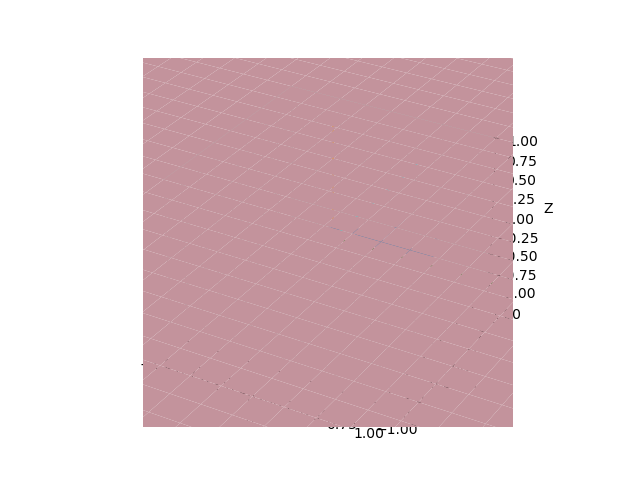

In [20]:
%matplotlib notebook
%matplotlib ipympl

# Showing the position zero of the robot.
fig, ax = plot_utils.init_3d_figure()
my_chain.plot(joints=target_angles, ax=ax)

# Plane code modified from https://matplotlib.org/stable/plot_types/3D/surface3d_simple.html
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
Z = np.zeros_like(X) + 1

ax.plot_surface(X, Y, Z, vmin=Z.min() * 2, color="pink")

In [21]:
plt.close() # clear memory of these intensive plots

In [22]:
class Plane:
    """Defines a plane object, defined by its normal and a point on the plane."""
    def __init__(self, point, normal):
        self.point = point
        self.normal = normal
    

In [116]:
def plot_scenario(chain, p, joint_angles=None, filename="Robot.png", download=False):
    """Plot chain and plane p using matplotlib's 3D plotting."""
    # Showing the position zero of the robot.
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    
    # Plotting code modified from https://matplotlib.org/stable/plot_types/3D/surface3d_simple.html
    if p.normal["c"] != 0: # Check x component of the normal,
        X = np.arange(-5, 5, 0.25)
        Y = np.arange(-5, 5, 0.25)
        X, Y = np.meshgrid(X, Y)
        Z = -(p.normal["a"]/p.normal["c"])*(X-p.point["x"]) - (p.normal["b"]/p.normal["c"])*(Y-p.point["y"])+p.point["z"]
    elif p.normal["a"] != 0:
        Y = np.arange(-5, 5, 0.25)
        Z = np.arange(-5, 5, 0.25)
        Y, Z = np.meshgrid(Y, Z)
        X = -(p.normal["c"]/p.normal["a"])*(Z-p.point["z"]) - (p.normal["b"]/p.normal["a"])*(Y-p.point["y"])+p.point["x"]
    elif p.normal["b"] != 0: # If the z component is 0, we must define our plane equation through an axis other than Z.
        X = np.arange(-5, 5, 0.25)
        Z = np.arange(-5, 5, 0.25)
        X, Z = np.meshgrid(X, Z)
        Y = -(p.normal["a"]/p.normal["b"])*(X-p.point["x"]) - (p.normal["c"]/p.normal["b"])*(Z-p.point["z"])+p.point["y"]
    else:
        print("Something strange happened")

    #ax.view_init(elev=20, azim=-60)

    #ax.set_xlim(-4, 4)
    #ax.set_ylim(0, .7)
    #ax.set_zlim(-4, 4)

    ax.plot_surface(X, Y, Z, vmin=Z.min() * 2, color="hotpink", alpha=0.6)

    chain.plot(joints=joint_angles, ax=ax) # Plot chain after surface

    plt.show()

    if download:
        plt.savefig(filename, dpi=300)



In [24]:
my_plane = Plane({"x":0, "y":0, "z":1}, {"a":0, "b":0, "c":1})

In [25]:
my_plane = Plane({"x":1, "y":0, "z":0}, {"a":1, "b":0, "c":1})

In [87]:
plot_scenario(my_chain, my_plane, target_angles)

In [27]:
plt.close()

In [28]:
def get_plane_side(point, p: Plane):
    """Returns returns +1 if point is on the normal side of the plane.
       Returns -1 if point is on the non-normal side of the plane.
       Returns 0 if point is on the plane.
       Point is an array of form [x, y, z, 1]"""
    value = p.normal["a"]*(point[0] - p.point["x"]) + p.normal["b"]*(point[1] - p.point["y"]) + p.normal["c"]*(point[2] - p.point["z"])
    if value == 0:
        return 0
    else:
        return value/abs(value)

In [29]:
def through_plane(a, b, p: Plane):
    """Given two points, a and b of form [x, y, z, 1], 
    determines if the path between those points intersects the plane"""
    if get_plane_side(a, p) == 0 or get_plane_side(b, p) == 0:
        return True
    return (get_plane_side(a, p) + get_plane_side(b, p) == 0)

In [30]:
def collision(chain, transformation_matrixes, plane):
    """ Given a chain object and a plane object, determine if the chain is currently colliding with the plane.
    Must provide transformation_matrixes with full_kinematics set to true
    Returns true if colliding
    Returns false otherwise"""

    # Code modified from https://github.com/Phylliade/ikpy/blob/master/src/ikpy/utils/plot.py
    prev_node = [0., 0., 0., 1]
    for (index, link) in enumerate(chain.links):
        (curr_node, orientation) = geometry.from_transformation_matrix(transformation_matrixes[index])
        if through_plane(prev_node, curr_node, plane):
            return True
        prev_node = curr_node
    return False

In [31]:
collision(my_chain, translation, my_plane)

False

## Tests

The below test should return True, as in the visual we see the plane is intersecting the robot. Touching should count as intersecting.

In [32]:
test_plane = Plane({"x":0, "y":0, "z":.5}, {"a":0, "b":1, "c":0})

In [33]:
plot_scenario(my_chain, test_plane, target_angles)

In [34]:
plt.close()

In [35]:
collision(my_chain, translation, test_plane)

True

The below test should also return False, as we see the plan is intersecting the robot.

In [36]:
test_plane = Plane({"x":.25, "y":0, "z":.5}, {"a":1, "b":0, "c":0})

In [37]:
plot_scenario(my_chain, test_plane, target_angles)

In [38]:
plt.close()

In [39]:
collision(my_chain, translation, test_plane)

True

The below test should return false since the plane is not intersecting the robot.

In [40]:
test_plane = Plane({"x":0, "y":-1, "z":.5}, {"a":0, "b":1, "c":0})

In [41]:
plot_scenario(my_chain, test_plane, target_angles)

In [42]:
plt.close()

In [43]:
collision(my_chain, translation, test_plane)

False

# Question 5

    Write code to generate a trajectory that starts from the robot arm at zero position, and moves the end effector in such a way that the end effector approaches very near to the plane, but no part of the robot arm intersects the plane. Create an mp4 animation of your robot arm moving (either directly in python, or by saving multiple .png files to disk and animating the series of png files with a program like ffmpeg, and submit along with your writeup.

Hint: manually define a few "safe" waypoints, starting from the zero position. Look at the inverse kinematics module and try setting the starting_nodes_angles using previous "safe" solutions. You may also try setting the orientation mode.

(Extra credit) Visualize the trajectory of the robot end effector by "tracing a line" in your visualization, and make the robot arm "draw something" on the plane.

In [44]:
initial_angles = [0.0] * len(my_chain.links) 
target_position = [ 0.1, -0.2, 0.1]

# translation is the robot's rotation and position values after bringing it to position zero.
translation = my_chain.forward_kinematics(initial_angles)

print(translation)

[[-1.79489651e-09  1.00000000e+00  3.58979303e-09  8.17250000e-01]
 [ 1.00000000e+00  1.79489651e-09  0.00000000e+00  1.91450000e-01]
 [-6.44330700e-18  3.58979303e-09 -1.00000000e+00 -5.49099853e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [45]:
drawing_plane = Plane({"x":0, "y":.5, "z":0}, {"a":0, "b":1, "c":0})

In [46]:
plot_scenario(my_chain, drawing_plane, initial_angles)

In [47]:
plt.close()

In [48]:
def correct_spot(a, b):
    """Returns true if a is roughly in the same spot as b
    a and b must represent points. There is a margin of error to allow it to be correct"""
    x_coord_good = abs(a[0] - b[0]) < 0.25
    y_coord_good = abs(a[1] - b[1]) < 0.25
    z_coord_good = abs(a[2] - b[2]) < 0.25
    return x_coord_good and y_coord_good and z_coord_good

In [49]:
def check_destination(chain, p, target_position, initial_angles=None):
    """Returns a joint_angles that is reachable to target_position with initial_angles without touching plane"""

    # Reset the robot to initial position.
    if initial_angles is None:
        initial_angles = [0.0] * len(chain.links) 
    
    #translation = chain.forward_kinematics(initial_angles, full_kinematics=True)

    joint_angles = chain.inverse_kinematics(target_position, initial_position=initial_angles)
    translation = chain.forward_kinematics(joint_angles,  full_kinematics=True)

    # Current solution is to randomnly try moving until it works.
    while (not collision(chain, translation, p)) and (not correct_spot(translation[-1][:3, 3], target_position)):
        # Determine a good "close but not touching target"
        print(f"Original End-effector Position {translation[-1][:3, 3]}")
        print(f"Target Position: {target_position}")
        joint_angles = chain.inverse_kinematics(target_position, initial_position=initial_angles)
        translation = chain.forward_kinematics(joint_angles,  full_kinematics=True)
        print(f"New Target Position: {translation[-1][:3, 3]}")
        updated_target_position = translation[-1][:3, 3] # This is our "close but not touching" target!"

    
    return joint_angles
    

In [50]:
def find_between_point(a, b, ratio):
    """ Given point a and point b, determine the point between point a and b at ratio"""
    return (a + b) * ratio

In [51]:
def find_halfway_angles(chain, p, start_angles, end_angles):
    start_position = chain.forward_kinematics(start_angles, full_kinematics=True)[-1][:3, 3]
    end_position = chain.forward_kinematics(end_angles, full_kinematics=True)[-1][:3, 3]
    halfway_position = find_between_point(start_position, end_position, 0.5)
    return check_destination(chain, p, halfway_position, start_angles)

In [132]:
def create_path(chain, p, final_joint_angles, initial_joint_angles=None, num_iters=3):
    """Given a robot chain and plane p, move the robot chain such that its end effector point is almost but not quite
    touching the plane from zero position, but that no other part of the robot chain is touching the plane."""
    # Store the path we take to get there

    if initial_joint_angles is None:
        initial_joint_angles = initial_angles = [0.0] * len(chain.links)
    
    path = [initial_joint_angles]

    # Find the angles between start and ending angles
    mid_angles = find_halfway_angles(chain, p, initial_joint_angles, final_joint_angles)
    path.insert(1, mid_angles)
    path.append(final_joint_angles)

    # First pass, go through all elements in the array and compute midangles for them! Do this iter number times
    for i in range(num_iters):
        current_check = 1
        while current_check < len(path):
            if current_check != 0:
                mid_angles = find_halfway_angles(chain, p, path[current_check-1], path[current_check])
                path.insert(current_check, mid_angles)
                current_check += 2

    return path

In [137]:
final_destination_angles = check_destination(my_chain, drawing_plane, list(drawing_plane.point.values()))

In [143]:
path = create_path(my_chain, drawing_plane, final_destination_angles, num_iters=5)

In [144]:
print(path)

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], array([ 0.        ,  0.00613   , -0.01165069,  0.02559345,  0.06216118,
       -0.05264619,  0.        ,  0.        ]), array([ 0.        ,  0.01273489, -0.02364837,  0.05486278,  0.1191322 ,
       -0.10533897,  0.        ,  0.        ]), array([ 0.        ,  0.01985276, -0.0246013 ,  0.0642116 ,  0.18656495,
       -0.15917622,  0.        ,  0.        ]), array([ 0.        ,  0.02786046,  0.02768752, -0.03434954,  0.30133773,
       -0.22857225,  0.        ,  0.        ]), array([ 0.        ,  0.03621264,  0.0221653 , -0.0085221 ,  0.36413221,
       -0.28468524,  0.        ,  0.        ]), array([ 0.        ,  0.04499755,  0.02016159,  0.01433591,  0.43620043,
       -0.33636014,  0.        ,  0.        ]), array([ 0.        ,  0.05449873,  0.00374831,  0.07078516,  0.48876432,
       -0.39174399,  0.        ,  0.        ]), array([ 0.        ,  0.06400756, -0.05364227,  0.2084126 ,  0.47273311,
       -0.43436037,  0.        ,  0.        ]

In [118]:
def create_path_images(chain, p, path):
    for i in range(len(path)):
        filename = f"path_image_{i}"
        plot_scenario(chain, p, path[i], filename) 

In [117]:
create_path_images(my_chain, drawing_plane, path) # no download

TypeError: create_path_images() got an unexpected keyword argument 'download'

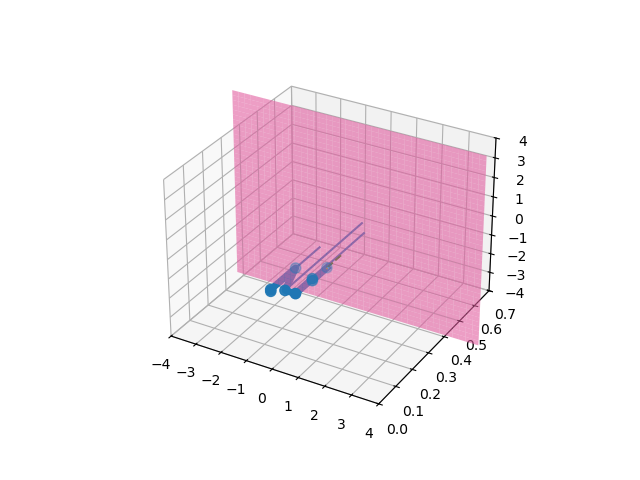

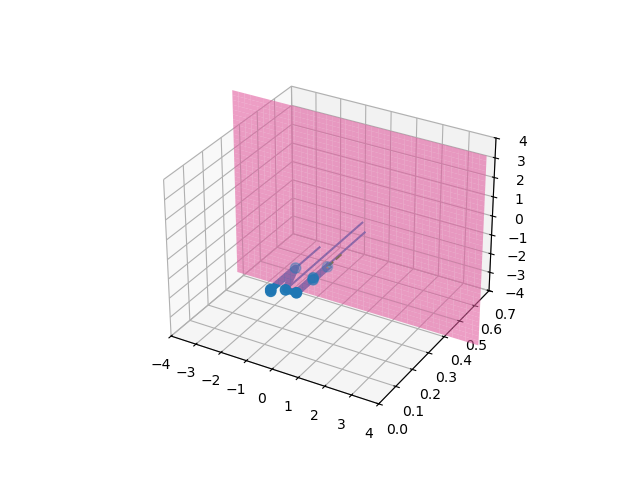

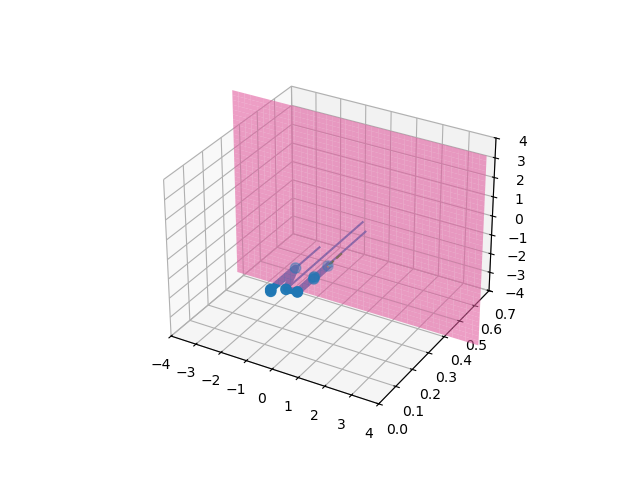

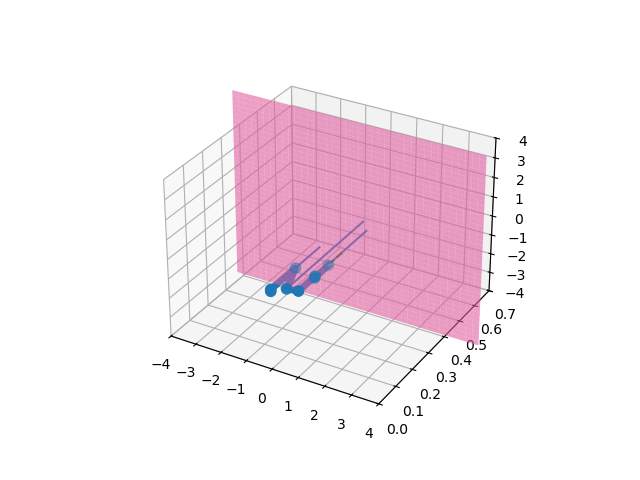

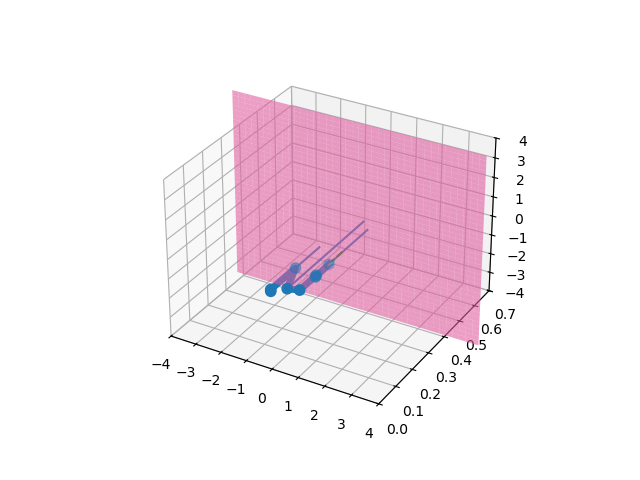

...

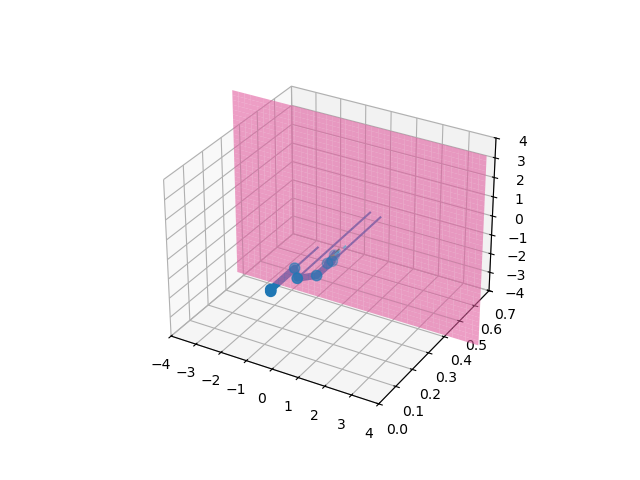

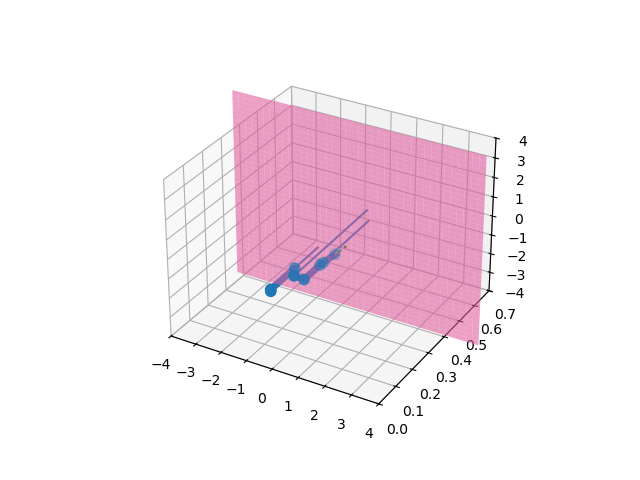

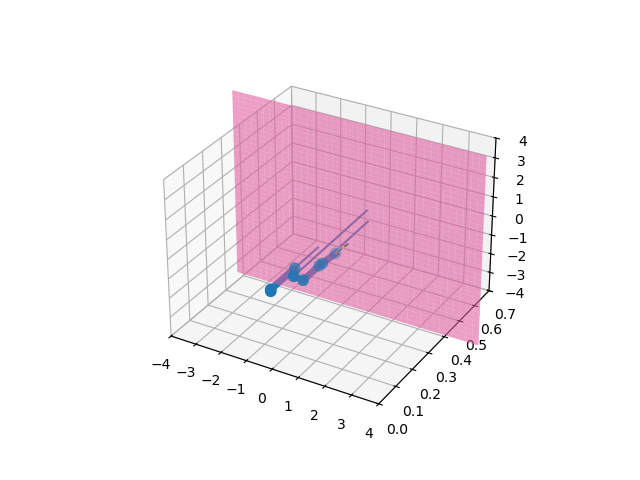

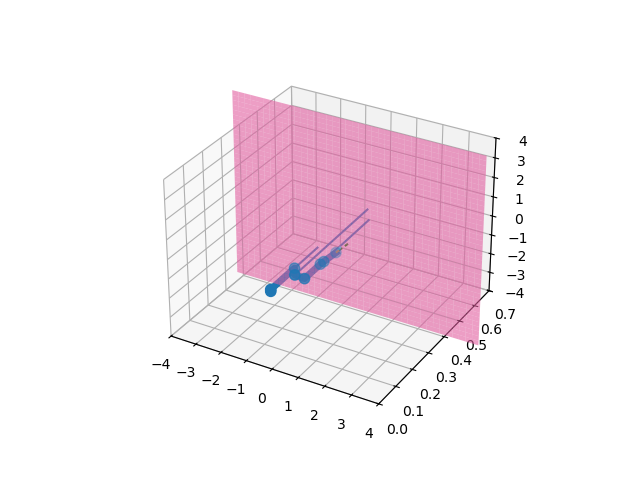

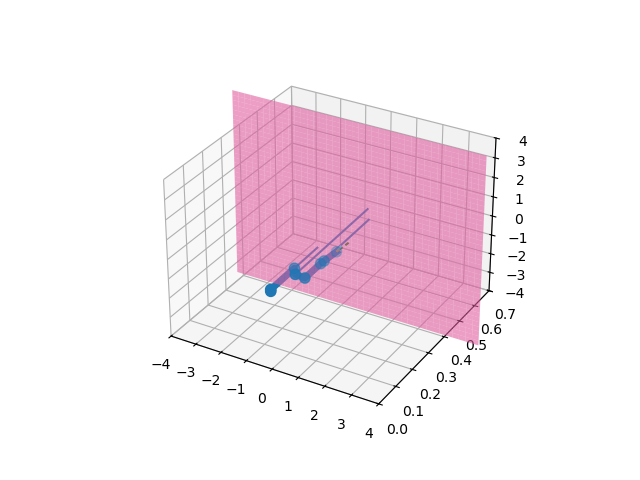

/tmp/ipykernel_38336/4247688828.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


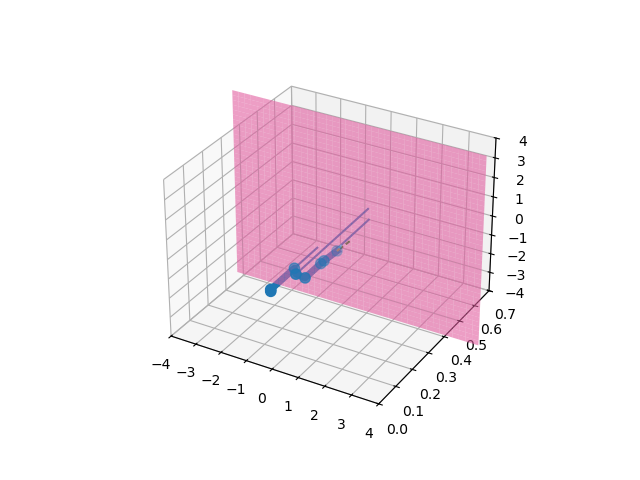

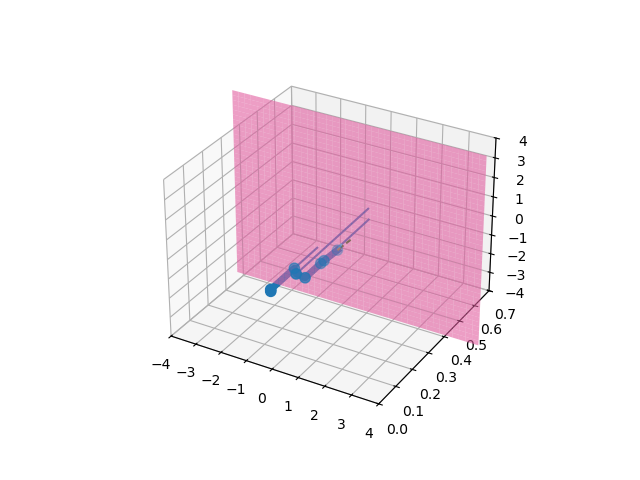

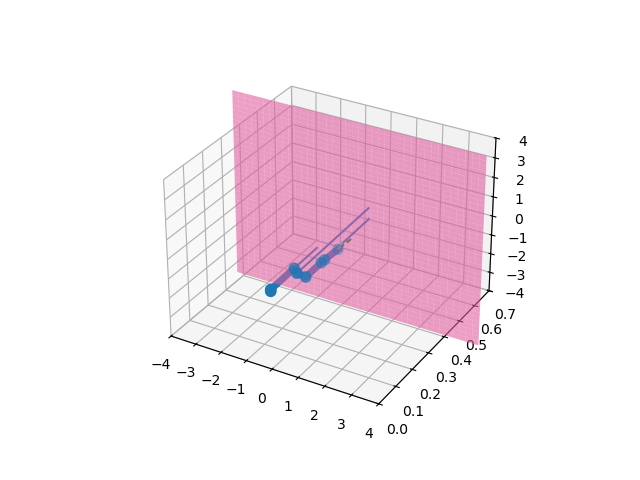

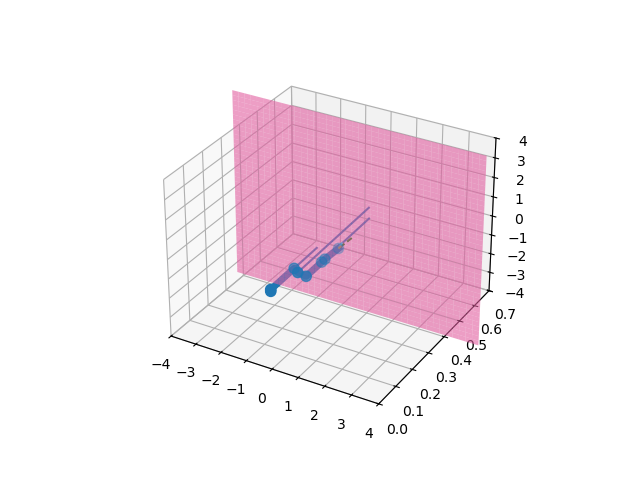

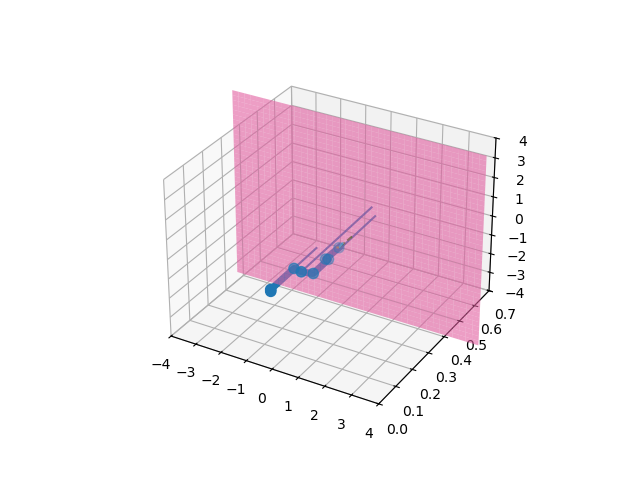

...

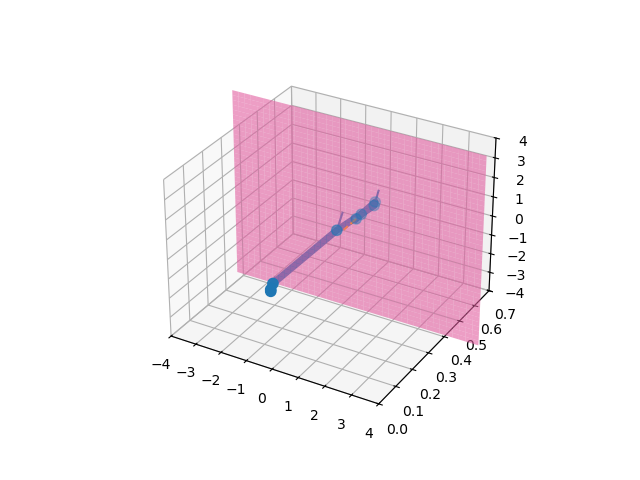

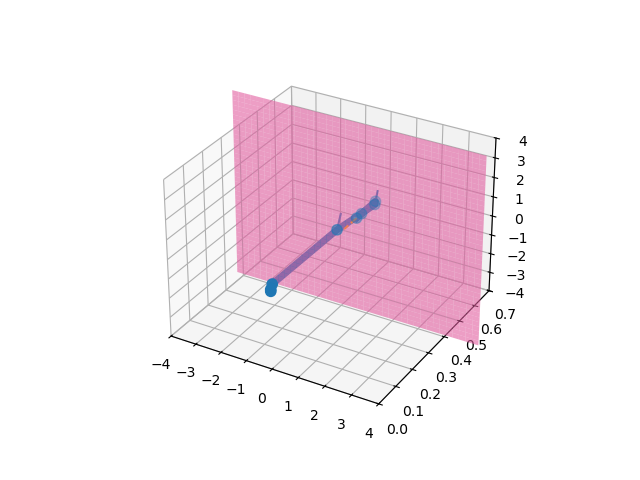

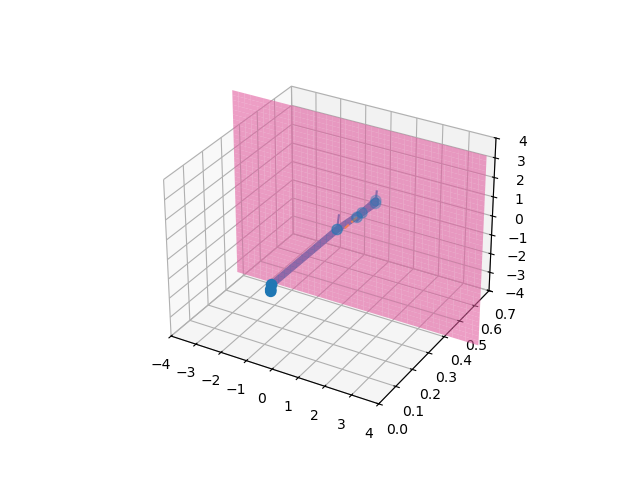

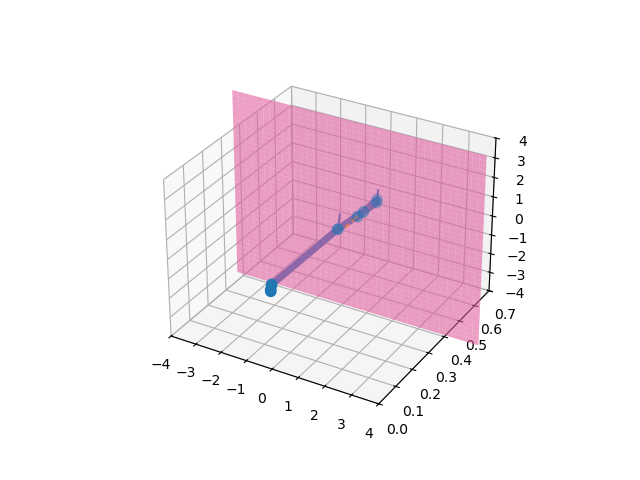

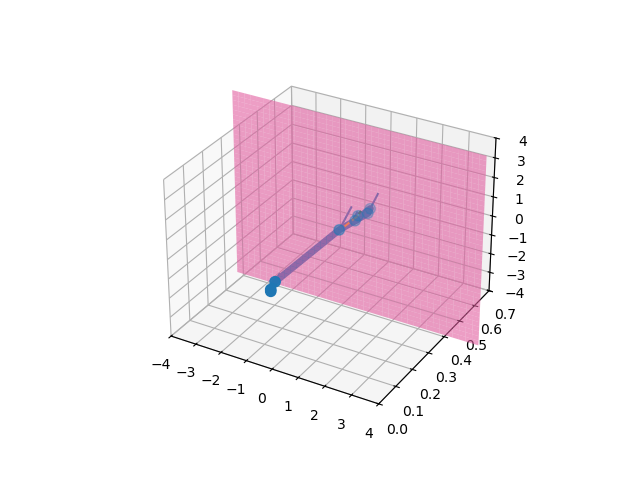

In [146]:
for i in range(len(path)):
        filename = f"path_image_{i}"
        plot_scenario(my_chain, drawing_plane, path[i], filename, download=True) 

In [145]:
plt.close('all')

I really wanted to do the extra credit, but I was already really struggling with the regular assignment. Below is my best attempt.

In [140]:
def plot_scenario(chain, p, joint_angles=None, filename="Robot.png", download=False):
    """Plot chain and plane p using matplotlib's 3D plotting."""
    # Showing the position zero of the robot.
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    
    # Plotting code modified from https://matplotlib.org/stable/plot_types/3D/surface3d_simple.html
    if p.normal["c"] != 0: # Check x component of the normal,
        X = np.arange(-5, 5, 0.25)
        Y = np.arange(-5, 5, 0.25)
        X, Y = np.meshgrid(X, Y)
        Z = -(p.normal["a"]/p.normal["c"])*(X-p.point["x"]) - (p.normal["b"]/p.normal["c"])*(Y-p.point["y"])+p.point["z"]
    elif p.normal["a"] != 0:
        Y = np.arange(-5, 5, 0.25)
        Z = np.arange(-5, 5, 0.25)
        Y, Z = np.meshgrid(Y, Z)
        X = -(p.normal["c"]/p.normal["a"])*(Z-p.point["z"]) - (p.normal["b"]/p.normal["a"])*(Y-p.point["y"])+p.point["x"]
    elif p.normal["b"] != 0: # If the z component is 0, we must define our plane equation through an axis other than Z.
        X = np.arange(-5, 5, 0.25)
        Z = np.arange(-5, 5, 0.25)
        X, Z = np.meshgrid(X, Z)
        Y = -(p.normal["a"]/p.normal["b"])*(X-p.point["x"]) - (p.normal["c"]/p.normal["b"])*(Z-p.point["z"])+p.point["y"]
    else:
        print("Something strange happened")

    #ax.view_init(elev=20, azim=-60)

    ax.set_xlim(-4, 4)
    ax.set_ylim(0, .7)
    ax.set_zlim(-4, 4)

    ax.plot_surface(X, Y, Z, vmin=Z.min() * 2, color="hotpink", alpha=0.6)

    chain.plot(joints=joint_angles, ax=ax) # Plot chain after surface

    plt.show()

    if download:
        plt.savefig(filename, dpi=300)

